In [1]:
import pandas as pd
import numpy as np
import time

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [4]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [6]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Ridge

In [69]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [8]:
df = pd.read_excel(r'AirQualityUCI.xlsx')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
 15  Unnamed: 15    0 non-

In [10]:
df.isna().sum()

Date                0
Time                0
CO(GT)              0
PT08.S1(CO)         0
NMHC(GT)            0
C6H6(GT)            0
PT08.S2(NMHC)       0
NOx(GT)             0
PT08.S3(NOx)        0
NO2(GT)             0
PT08.S4(NO2)        0
PT08.S5(O3)         0
T                   0
RH                  0
AH                  0
Unnamed: 15      9357
Unnamed: 16      9357
dtype: int64

In [11]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,0.0,0.0
mean,-34.207524,1048.869652,-159.090093,1.865576,894.475963,168.604200,794.872333,58.135898,1391.363266,974.951534,9.776600,39.483611,-6.837604,NaN,NaN
std,77.657170,329.817015,139.789093,41.380154,342.315902,257.424561,321.977031,126.931428,467.192382,456.922728,43.203438,51.215645,38.976670,NaN,NaN
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN
25%,0.600000,921.000000,-200.000000,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.950000,34.050000,0.692275,NaN,NaN
50%,1.500000,1052.500000,-200.000000,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,0.976823,NaN,NaN
75%,2.600000,1221.250000,-200.000000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223,NaN,NaN
max,11.900000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036,NaN,NaN


In [12]:
df.shape

(9357, 17)

In [13]:
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.600,48.875001,0.757754,NaN,NaN
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.300,47.700000,0.725487,NaN,NaN
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.900,53.975000,0.750239,NaN,NaN
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.000,60.000000,0.786713,NaN,NaN
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.150,59.575001,0.788794,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,2005-04-04,10:00:00,3.1,1314.25,-200,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250000,0.756824,NaN,NaN
9353,2005-04-04,11:00:00,2.4,1162.50,-200,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725000,0.711864,NaN,NaN
9354,2005-04-04,12:00:00,2.4,1142.00,-200,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350000,0.640649,NaN,NaN
9355,2005-04-04,13:00:00,2.1,1002.50,-200,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550000,0.513866,NaN,NaN


In [14]:
df.drop(['Unnamed: 15','Unnamed: 16'], axis = 1, inplace = True)

In [15]:
df.head(5)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [16]:
cols = np.asarray(df.columns[2:])

In [17]:
col_float = df.select_dtypes(include=[np.float]).columns

<ipython-input-17-3c96180b8c0d>:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  col_float = df.select_dtypes(include=[np.float]).columns


In [18]:
for col in cols:
    print(df[col].value_counts())

-200.0    1683
 1.0       305
 1.4       279
 1.6       275
 1.5       273
          ... 
 11.9        1
 9.3         1
 7.0         1
 11.5        1
 9.9         1
Name: CO(GT), Length: 97, dtype: int64
-200.00     366
 986.75      12
 954.25      12
 1099.50     12
 925.75      11
           ... 
 1241.00      1
 1820.75      1
 1495.50      1
 1378.25      1
 678.50       1
Name: PT08.S1(CO), Length: 3246, dtype: int64
-200    8443
 66       14
 40        9
 29        9
 93        8
        ... 
 259       1
 307       1
 339       1
 347       1
 783       1
Name: NMHC(GT), Length: 430, dtype: int64
-200.000000    366
 6.849892       13
 4.045717        9
 10.184263       9
 6.810175        9
              ... 
 26.615756       1
 25.600774       1
 8.209144        1
 27.462413       1
 6.477490        1
Name: C6H6(GT), Length: 3773, dtype: int64
-200.00     366
 850.25      13
 791.00       9
 713.25       9
 984.50       9
           ... 
 1434.25      1
 473.00       1
 552.50  

In [19]:
df = df.replace(-200.0, np.nan)

In [20]:
df.isna().sum()

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [21]:
rm_nan = df.drop([r'NMHC(GT)'], axis = 1)
print(rm_nan.head(5))
rm_nan.isna().sum()

        Date      Time  CO(GT)  PT08.S1(CO)   C6H6(GT)  PT08.S2(NMHC)  \
0 2004-03-10  18:00:00     2.6      1360.00  11.881723        1045.50   
1 2004-03-10  19:00:00     2.0      1292.25   9.397165         954.75   
2 2004-03-10  20:00:00     2.2      1402.00   8.997817         939.25   
3 2004-03-10  21:00:00     2.2      1375.50   9.228796         948.25   
4 2004-03-10  22:00:00     1.6      1272.25   6.518224         835.50   

   NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)      T  \
0    166.0       1056.25    113.0       1692.00      1267.50  13.60   
1    103.0       1173.75     92.0       1558.75       972.25  13.30   
2    131.0       1140.00    114.0       1554.50      1074.00  11.90   
3    172.0       1092.00    122.0       1583.75      1203.25  11.00   
4    131.0       1205.00    116.0       1490.00      1110.00  11.15   

          RH        AH  
0  48.875001  0.757754  
1  47.700000  0.725487  
2  53.975000  0.750239  
3  60.000000  0.786713  
4  59.575

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [22]:
def remove_nan(df, target):
    df[target].fillna(df[target].mean(), inplace=True)
    return df

In [23]:
nan_remove = cols[cols != r'NMHC(GT)']

In [24]:
for col in nan_remove:
    df = remove_nan(df, col)

In [25]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150.0,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112.0,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88.0,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80.0,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51.0,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [26]:
df.isna().sum()

Date                0
Time                0
CO(GT)              0
PT08.S1(CO)         0
NMHC(GT)         8443
C6H6(GT)            0
PT08.S2(NMHC)       0
NOx(GT)             0
PT08.S3(NOx)        0
NO2(GT)             0
PT08.S4(NO2)        0
PT08.S5(O3)         0
T                   0
RH                  0
AH                  0
dtype: int64

In [27]:
from sklearn.ensemble import RandomForestRegressor

In [28]:
df_nn = df[df[r'NMHC(GT)'].notnull()]
df_n = df[df[r'NMHC(GT)'].isnull()]
x = df_nn.loc[:, nan_remove].values
x_pred = df_n.loc[:, nan_remove].values
y = df_nn.loc[:, r'NMHC(GT)'].values
rfr = RandomForestRegressor(max_depth=10)
rfr.fit(x, y)
yn_pred = rfr.predict(x_pred)
df_n.loc[:, r'NMHC(GT)'] = yn_pred

C:\Users\User2-NB\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [29]:
df_arr = np.vstack([df_nn, df_n])
df = pd.DataFrame(df_arr, columns=df.columns)

In [30]:
df[col_float] = df[col_float].astype(np.float64)

In [31]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150.0,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112.0,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88.0,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80.0,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51.0,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [32]:
df.isna().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [106]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

In [109]:
df.drop([df.columns[0], df.columns[1]], axis=0, inplace=True)

KeyError: "['Date' 'Time'] not found in axis"

In [33]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.152750,1099.707856,10.082993,939.029205,246.881252,835.370973,113.075515,1456.143486,1022.780725,18.316054,49.232360,1.025530
std,1.316068,212.796116,7.302474,261.557856,193.419417,251.741784,43.911095,339.365351,390.609000,8.658396,16.974308,0.395836
min,0.100000,647.250000,0.149048,383.250000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.175000,0.184679
25%,1.200000,941.250000,4.591495,742.500000,112.000000,665.500000,85.900000,1241.500000,741.750000,12.025000,36.550000,0.746115
50%,2.152750,1074.500000,8.593367,923.250000,229.000000,817.500000,113.075515,1456.143486,982.500000,18.275000,49.232360,1.015441
75%,2.600000,1221.250000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,11.900000,2039.750000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036


<AxesSubplot:>

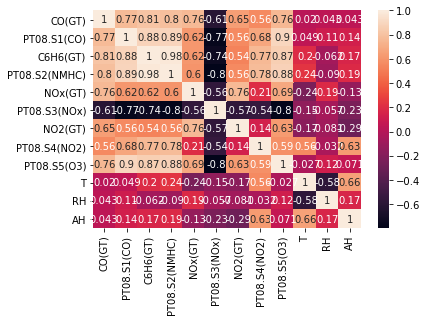

In [34]:
sns.heatmap(df.corr(), annot=True)

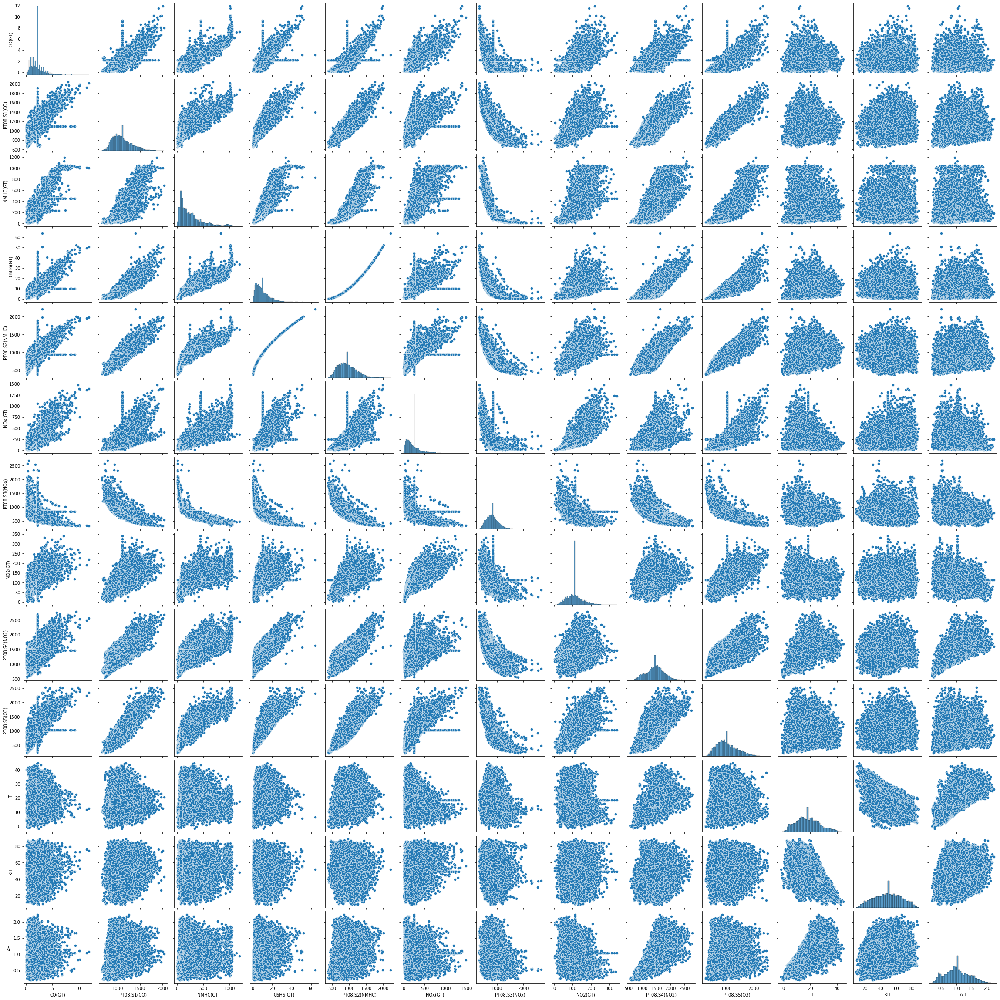

In [35]:
sns.pairplot(df, vars=cols)

In [36]:
def outliers(df, target):
    plt.figure(figsize=(10, 5))
    sns.boxplot(df[target])
    plt.show()

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


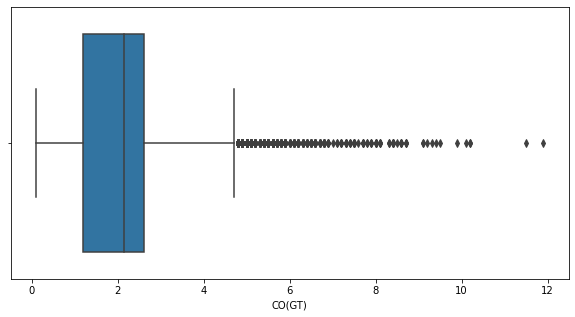

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


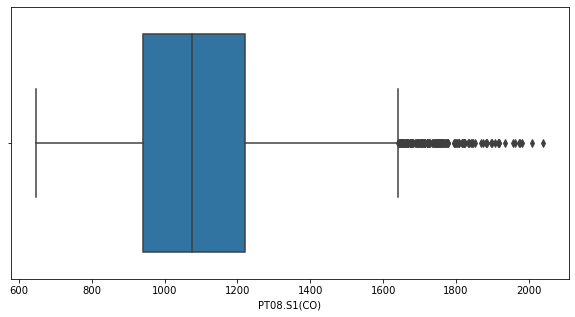

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


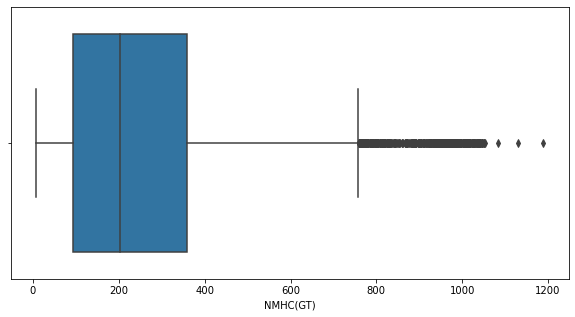

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


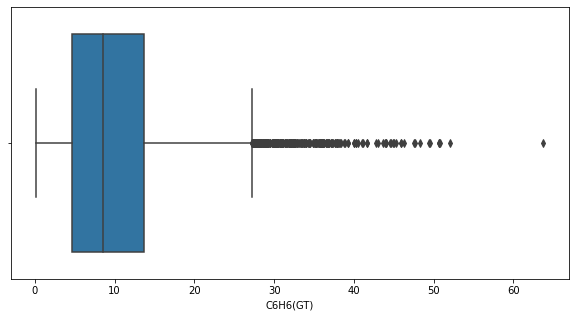

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


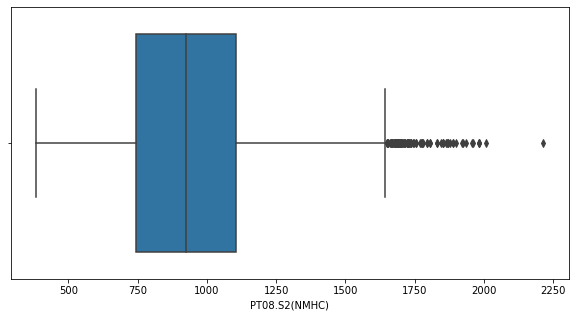

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


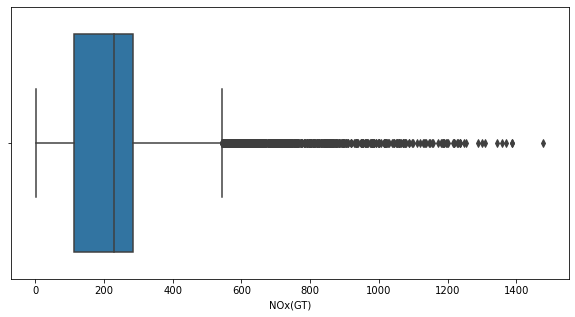

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


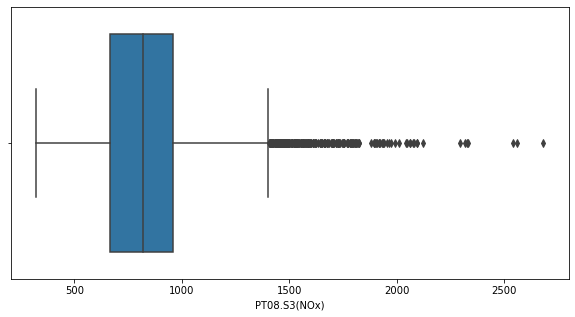

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


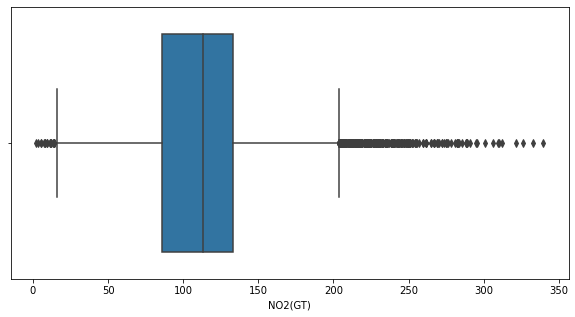

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


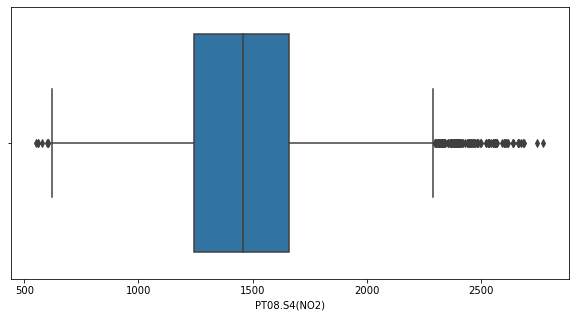

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


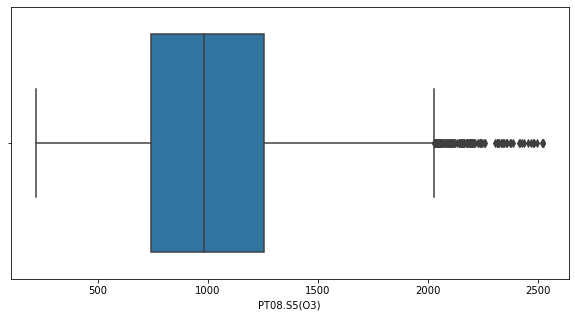

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


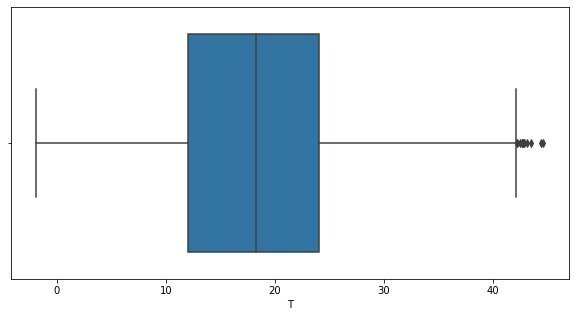

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


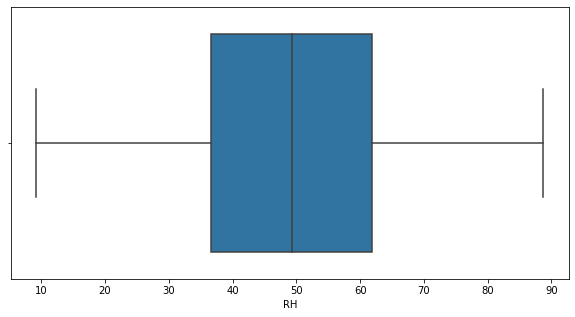

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


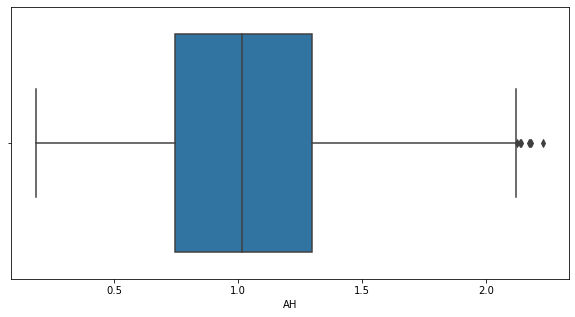

In [37]:
for col in cols:
    outliers(df, col)

In [38]:
def remove_outliers(df, target):
    perc = np.percentile(df[target], [0, 25, 50, 75, 100])
    iqr = perc[3] - perc[1]
    min_ = perc[1] - iqr*1.5
    max_ = perc[3] + iqr*1.5
    min_outliers = df.loc[(df[target] < min_), target].index
    max_outliers = df.loc[(df[target] > max_), target].index
    if len(min_outliers) != 0:
        df.loc[min_outliers, target] = min_
    if len(max_outliers) != 0:
        df.loc[max_outliers, target] = max_
    return df

In [39]:
for col in col_float:
    df = remove_outliers(df, col)

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


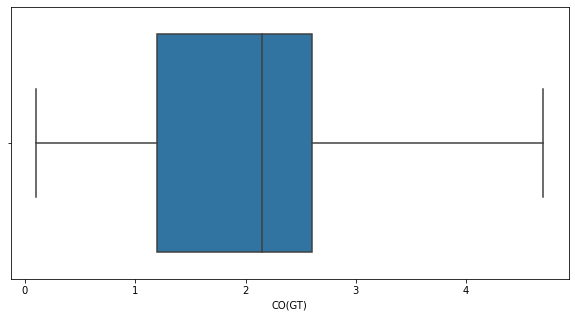

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


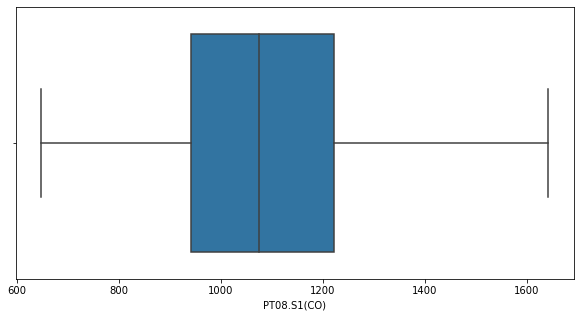

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


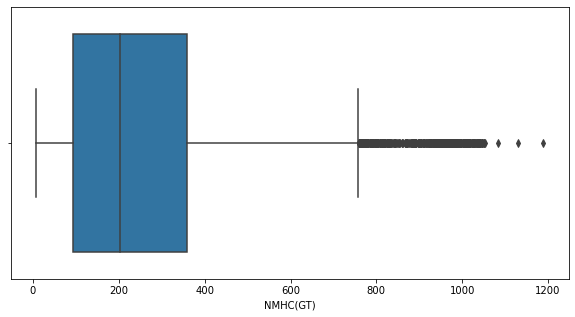

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


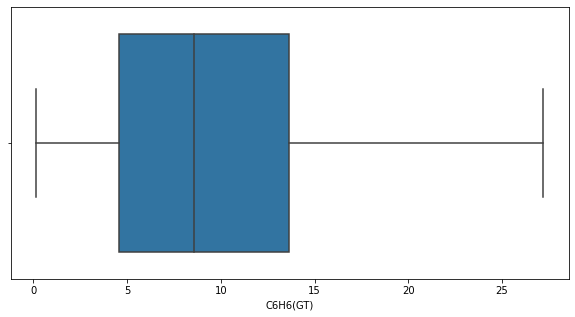

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


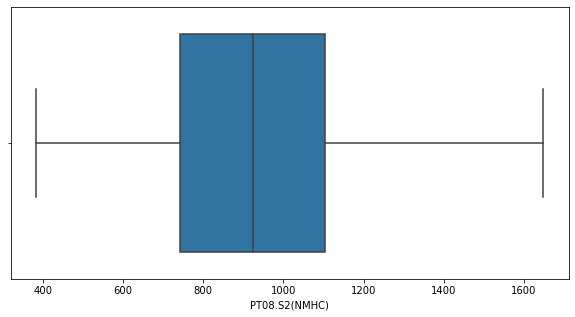

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


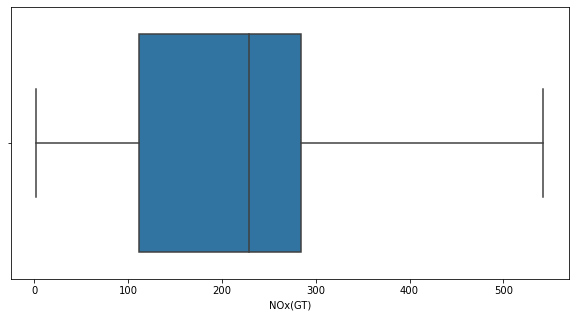

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


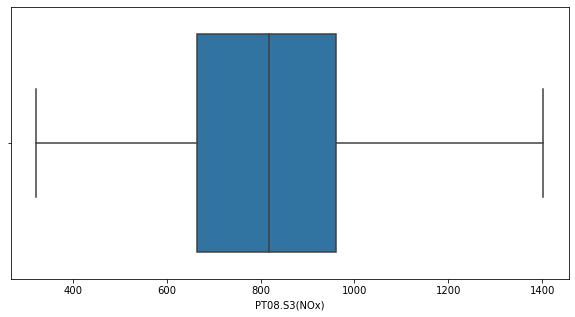

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


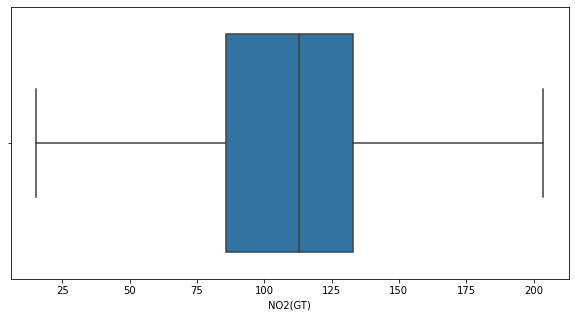

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


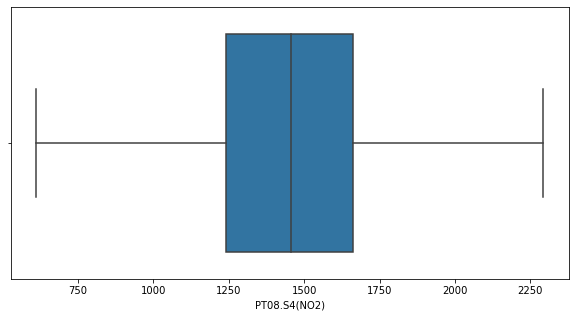

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


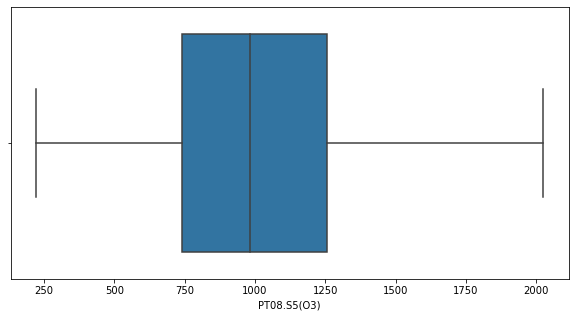

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


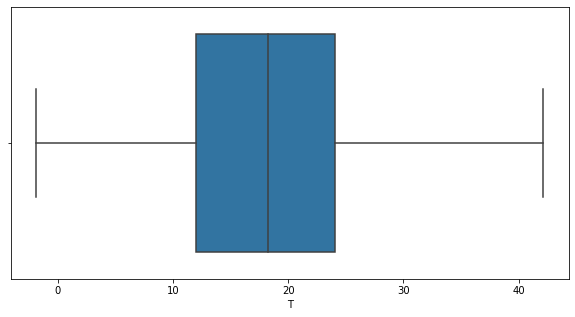

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


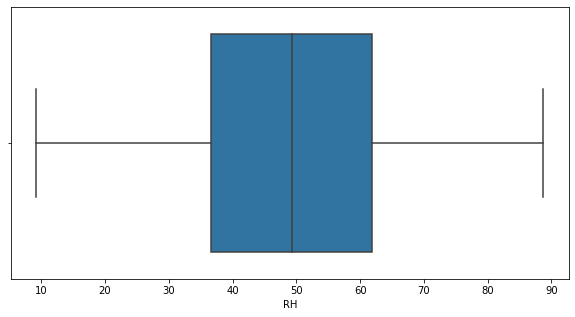

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


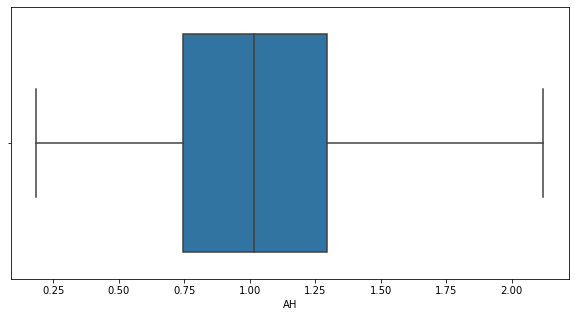

In [40]:
for col in cols:
    outliers(df, col)

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NMHC(GT)'>

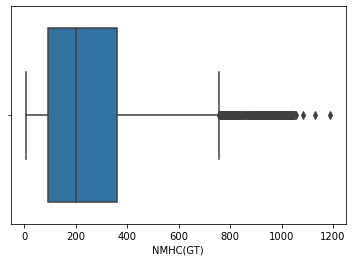

In [41]:
sns.boxplot(df[r'NMHC(GT)'])

In [42]:
df = remove_outliers(df, r'NMHC(GT)')

In [43]:
col_float

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH'],
      dtype='object')

C:\Users\User2-NB\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NMHC(GT)'>

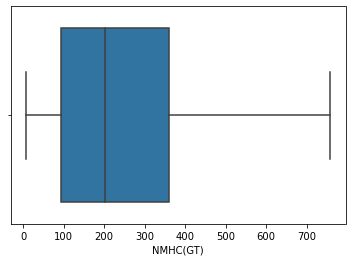

In [44]:
sns.boxplot(df[r'NMHC(GT)'])

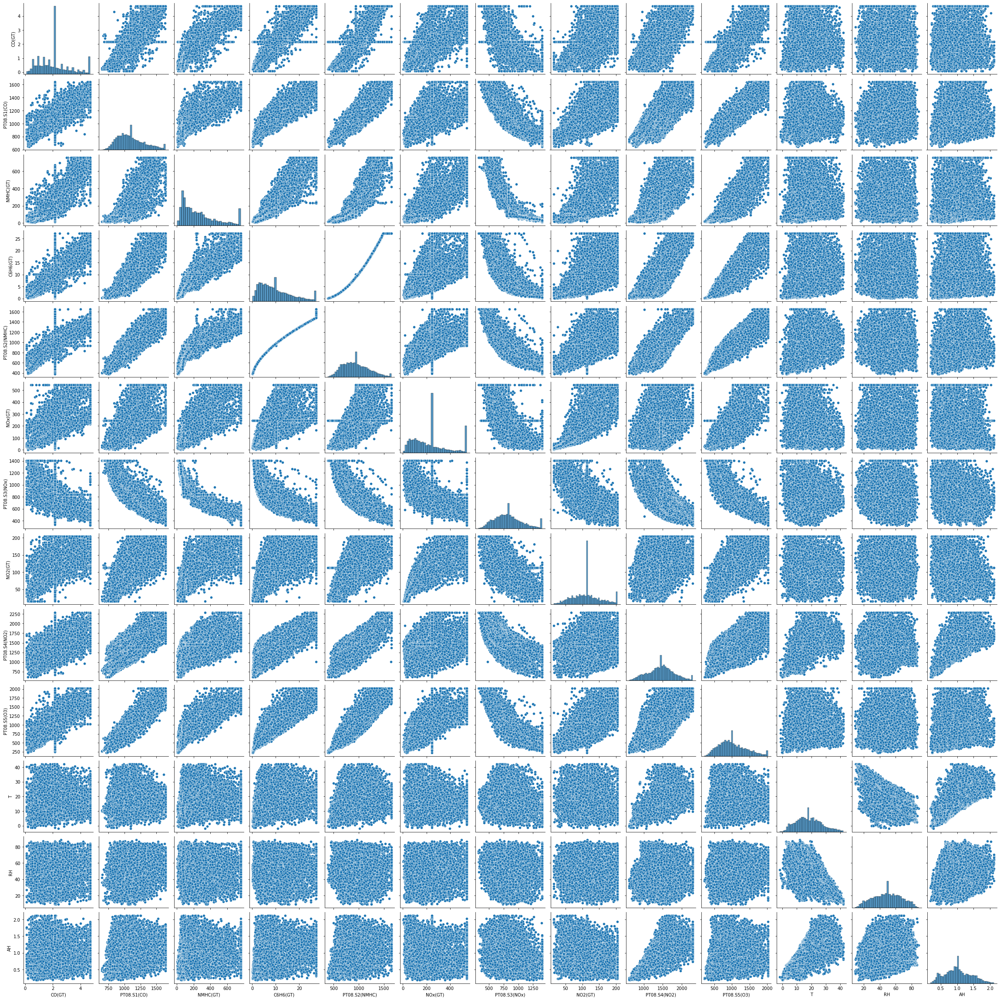

In [59]:
sns.pairplot(df, vars=cols)

In [45]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.092314,1097.978064,9.903435,937.913801,230.327965,828.881896,112.030004,1454.089632,1020.630579,18.314956,49.232360,1.025497
std,1.131410,207.581377,6.716033,258.056176,146.435503,230.593029,40.982084,333.386933,384.289248,8.655278,16.974308,0.395741
min,0.100000,647.250000,0.149048,383.250000,2.000000,322.000000,15.250000,610.750000,221.000000,-1.900000,9.175000,0.184679
25%,1.200000,941.250000,4.591495,742.500000,112.000000,665.500000,85.900000,1241.500000,741.750000,12.025000,36.550000,0.746115
50%,2.152750,1074.500000,8.593367,923.250000,229.000000,817.500000,113.075515,1456.143486,982.500000,18.275000,49.232360,1.015441
75%,2.600000,1221.250000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,4.700000,1641.250000,27.202986,1648.125000,542.500000,1402.375000,203.650000,2292.750000,2025.500000,42.150000,88.725000,2.121385


In [46]:
df_ml = df.copy()
ss = StandardScaler()
ss_cols = cols[:-2]
ss.fit(df[ss_cols])
df_ml[ss_cols] = ss.transform(df[ss_cols])

In [115]:
x = df_ml.loc[:, cols[:-2]]
y1 = df_ml.loc[:, cols[-2]]
y2 = df_ml.loc[:, cols[-1]]

<AxesSubplot:>

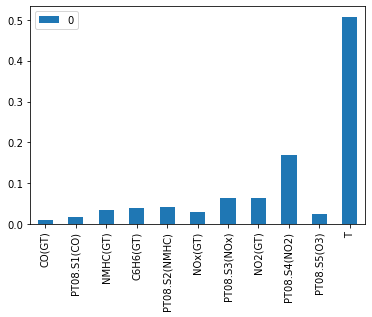

In [116]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(x, y1)
coefs = rfr.feature_importances_
coefs = pd.DataFrame(coefs, index=x.columns)
coefs.plot.bar()

In [49]:
coefs

CO(GT)           -0.481205
PT08.S1(CO)       0.755968
NMHC(GT)         -3.755098
C6H6(GT)          3.375996
PT08.S2(NMHC)   -23.901340
NOx(GT)           9.247224
PT08.S3(NOx)     -9.608874
NO2(GT)          -6.067722
PT08.S4(NO2)     19.823982
PT08.S5(O3)       0.513025
T               -15.761659
dtype: float64

<AxesSubplot:>

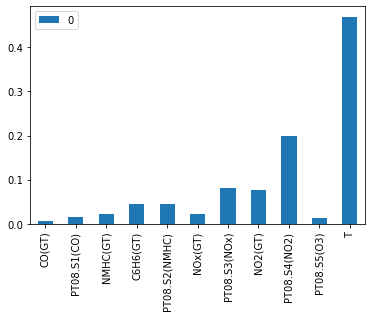

In [117]:
rfr.fit(x, y2)
coefs2 = rfr.feature_importances_
coefs2 = pd.DataFrame(coefs2, index=x.columns)
coefs2.plot.bar()

In [51]:
coefs2

CO(GT)          -0.010526
PT08.S1(CO)     -0.042635
NMHC(GT)        -0.083435
C6H6(GT)         0.196143
PT08.S2(NMHC)   -0.650903
NOx(GT)          0.182990
PT08.S3(NOx)    -0.264662
NO2(GT)         -0.129934
PT08.S4(NO2)     0.442619
PT08.S5(O3)      0.026946
T                0.121725
dtype: float64

In [83]:
def model(x, y, model):
    ml1 = model
    x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=0.3)
    start = time.time()
    model.fit(x_train, y_train)
    end = time.time()
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_pred, y_test)
    scores = pd.Series([mae, mse, rmse, r2], index=['MAE', 'MSE', 'RMSE', 'r2'])
    print(scores)
    r2 = 100*np.abs(r2)
    print(f"Time needed to train the model:{end-start} seconds")
    if x_test.shape[1] == 1:
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    else:
        fig, axes = plt.subplots(nrows=x_test.shape[1], ncols=2, figsize=(10,22))
    if x_test.shape[1] > 1:
        for i in range(x_test.shape[1]):
            axes[i][0].scatter(x_test[:, i], y_pred)
            axes[i][1].scatter(x_test[:, i], y_test)
            axes[i][0].set_title(f'Predicted')
            axes[i][1].set_title('Not Predicted')
            x1_test = np.arange(min(x_test[:, i]), max(x_test[:, i]), 0.0001)
            ml1.fit(x_train[:, i].reshape(-1, 1), y_train)
            y2_pred = ml1.predict(x1_test.reshape(-1, 1))
            axes[i][0].plot(x1_test, y2_pred, color='red')
    else:
        axes[0].scatter(x_test[:, 0], y_pred)
        axes[1].scatter(x_test[:, 0], y_test)
        axes[0].set_title(f'Predicted')
        axes[1].set_title('Not Predicted')
        x1_test = np.arange(min(x_test), max(x_test), 0.1)
        y1_pred = model.predict(x1_test.reshape(-1,1))
        axes[0].plot(x1_test, y1_pred, color='red')
    plt.tight_layout()
    plt.show()

MAE      10.974079
MSE     185.746733
RMSE     13.628893
r2       -0.930378
dtype: float64
Time needed to train the model:0.0010001659393310547 seconds


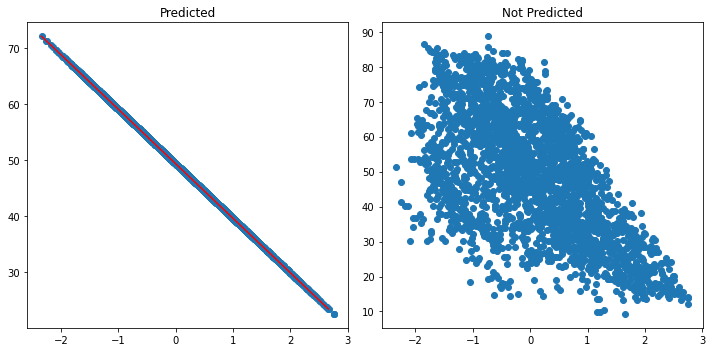

In [84]:
one_feature = SelectKBest(score_func=f_regression, k=1)
one_feature.fit(x, y1)
x_selected = one_feature.transform(x)
model(x_selected, y1, lr)

MAE     0.229530
MSE     0.087189
RMSE    0.295277
r2     -0.258743
dtype: float64
Time needed to train the model:0.0010004043579101562 seconds


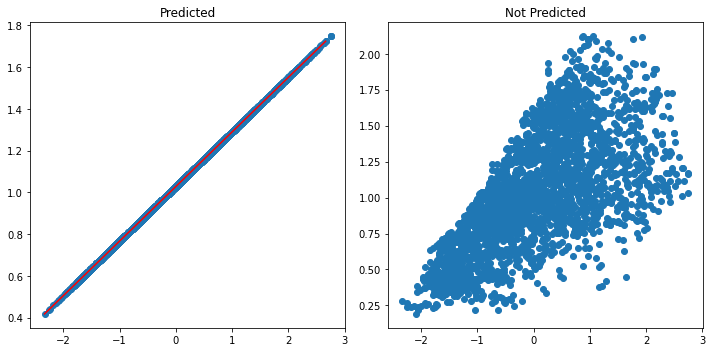

In [85]:
one_feature = SelectKBest(score_func=f_regression, k=1)
one_feature.fit(x, y2)
x_selected = one_feature.transform(x)
model(x_selected, y2, lr)

MAE      6.026642
MSE     60.850982
RMSE     7.800704
r2       0.741245
dtype: float64
Time needed to train the model:0.0030024051666259766 seconds


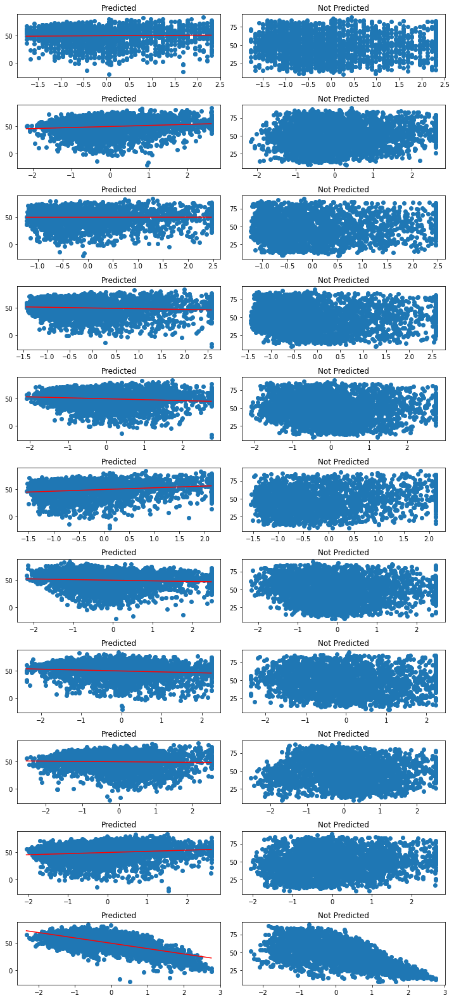

In [119]:
model(x.values, y1.values, lr)

MAE     0.117290
MSE     0.024019
RMSE    0.154981
r2      0.821703
dtype: float64
Time needed to train the model:0.0040013790130615234 seconds


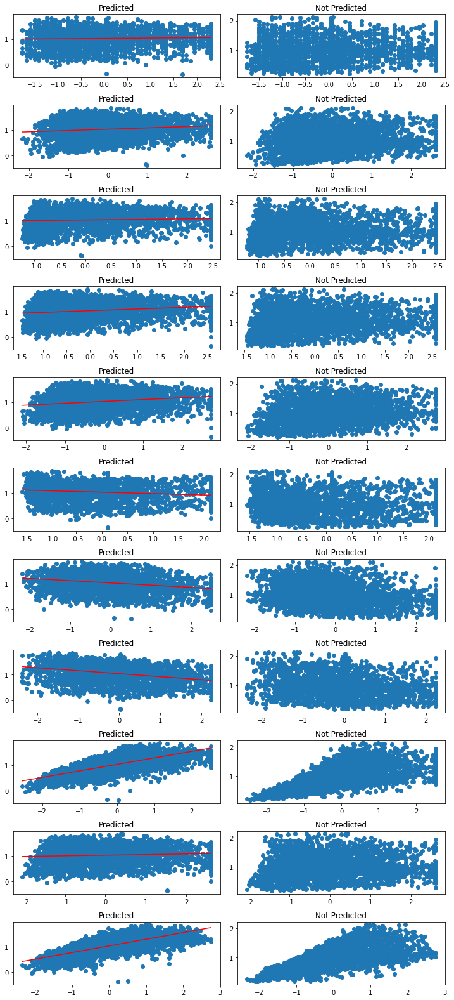

In [120]:
model(x.values, y2.values, lr)